# Eigenface Gesichtserkennung
* Autor: Prof. Dr. Johannes Maucher
* Datum: 27.11.2015

[Übersicht Ipython Notebooks im Data Mining Praktikum](Data Mining Praktikum.ipynb)

# Einführung
## Lernziele:

In diesem Versuch sollen Kenntnisse in folgenden Themen vermittelt werden:

* __Gesichtserkennung:__ mit der Eigenface Methode. 
* __Principal Component Analysis__
* __Bildverarbeitung__ mit Python.

Sämtliche Verfahren und Algorithmen werden in Python implementiert.

## Theorie zur Vorbereitung

Die Gesichtserkennung kann mit unterschiedlichen Ansätzen realisiert werden. In diesem Versuch wird ausschließlich der _Eigenface_-Ansatz vorgestellt. Dieser Ansatz basiert auf der _Principal Component Analysis (PCA)_ und wurde erstmals in [M. Turk, A. Pentland; Eigenfaces for Recognition](http://www.cs.ucsb.edu/%7Emturk/Papers/jcn.pdf) vorgestellt. Die Eigenface-Methode weist eine gute Performance im Fall biometrisch aufgenommener Gesichtsbilder auf.

### Das Prinzip der Eigenface Gesichtserkennung

Bilder mit $C$ Pixeln in der Breite und $R$ Pixeln in der Höhe können als $R \times C$ Matrizen abgespeichert werden. Handelt es sich um ein Schwarz-Weiß- oder Graustufen-Bild, dann wird pro Bild nur eine derartige Matrix benötigt. Der Eintrag in der i.ten Zeile und j.ten Spalte dieser Matrix definiert den Grauwert des entsprechenden Pixels. In Farbbildern werden je nach benutztem Farbraum mehrere  Matrizen pro Bild benötigt, wobei jede Matrix einen Farbkanal des Bildes repräsentiert. Für ein RGB-Bild werden z.B. 3 Matrizen für die Farbkanäle Rot, Grün und Blau benötigt. \\

Im Folgenden wird von quadratischen Graubildern mit $N \times N$ Pixeln ausgegangen. Wird jedes Pixel als ein Merkmal betrachtet, dann existieren insgesamt $N^2$ Merkmale, das Bild kann auch als ein Punkt im $N^2$-dimensionalen Raum betrachtet werden. Bilder der Auflösung $256 \times 256$ müßten also im $65536$-dimensionalen Raum beschrieben werden. Entsprechend komplex wäre die notwendige Verarbeitung. Ist jedoch bekannt, dass in einer Menge von Bildern jeweils ein gleichartiges Objekt abgebildet ist, z.B. wenn alle Bilder ausschließlich je ein Gesicht enthalten, dann existieren große Abhängigkeiten zwischen diesen Bildern. Geometrisch ausgedrückt bedeutet dies, dass die Punkte, welche die Menge der gleichartigen Bilder beschreiben, nicht gleichmäßig über den $N^2$-dimensionalen Raum verteilt sind, sondern in einen relativ kleinen Unterraum mit $K<<N^2$ Dimensionen nahezu vollständig beschrieben werden können. Jede dieser $K$ Dimensionen beschreibt ein für die Kategorie (z.B. Gesichtsbilder) relevantes Merkmal. Im Fall der Gesichtserkennung werden die relevanten Merkmale auch als Eigenfaces bezeichnet. Jedes Eigenface kann als Bild dargestellt werden, welches ein bestimmtes Gesichtsmerkmal besonders hervorhebt. Jedes individuelle Bild der Kategorie (d.h. jedes Gesicht) kann dann als Linearkombination der $K$ relevanten Merkmale (der $K$ Eigenfaces) beschrieben werden.\\

Das Problem besteht nun zunächst darin, aus einer Menge von Bildern der gleichen Kategorie die relevanten Merkmale zu finden. Dieses Problem wird durch die Principal Component Analysis (PCA) gelöst. Die PCA, findet in einer Menge von Bildern der gleichen Kategorie die Hauptachsen, also die Richtungen im $N^2$-dimensionalen Raum, entlang derer die Varianz zwischen den gegebenen Bildern am stärksten ist. Der $N^2$-dimensionale Pixelraum wird dann in einen Raum, der durch die gefundenen Hauptachsen aufgespannt wird, transformiert. In diesem in der Anzahl der Dimensionen stark reduzierten Raum wird dann die Bilderkennung durchgeführt. Der hier skizzierte Ansatz der Eigenfaces für die Gesichtserkennung wurde erstmalig in [M. Turk, A. Pentland; Eigenfaces for Recognition](http://www.cs.ucsb.edu/%7Emturk/Papers/jcn.pdf) beschrieben.

### Genereller Ablauf

Die Gesichtserkennung besteht aus 2 Phasen. In der Trainingsphase werden die Gesichtsbilder der zu erkennenden Personen eingelesen und für diese mit der PCA der Eigenface-Raum berechnet. In der Erkennungsphase wird ein neu aufgenommenes Bild in den Eigenface-Raum transformiert und dort dem naheliegendsten Bild aus der Trainingsmenge zugeordnet.

#### Trainingsphase

1. Lese Gesichtsbilder der Personen, die erkannt werden sollen ein. Die Menge dieser Bilder definiert das Trainingsset
2. Berechne mit der PCA den Eigenface-Raum. Dabei werden nur die K Dimensionen, welche zu den Eigenvektoren mit den größten Eigenwerten gehören ausgewählt. Die zu den K Dimensionen (Eigenvektoren) gehörenden Bilder sind die Eigenfaces.
3. Transformiere jedes Bild der Trainingsmenge in den Eigenface-Raum und erhalte so die entsprechende Repräsentation des Bildes als Punkt im Eigenface-Raum.

#### Erkennungsphase

1. Transformiere das zu erkennende Bild in den Eigenface-Raum und berechne dort die Koordinaten des Bildes hinsichtlich aller K-Dimensionen (Eigenfaces)
2. Bestimme ob das zu erkennende Bild überhaupt eine Gesicht darstellt
3. Bestimme ob das Gesicht zu einer bekannten Person, deren Bild in der Trainingsmenge enthalten ist, gehört.

#### Update (optional)

Füge das erkannte Bild zur Menge der Trainingsbilder hinzu und führe die Schritte der Trainingsphase durch.

### Bestimmung der Eigenfaces
<a id='theoryEig'></a>
Es werden zunächst $M$ Gesichtsbilder der zu erkennenden Personen eingelesen (von jeder zu erkennenden Personen möglichst mehrere Bilder). Es wird davon ausgegangen, dass jedes der Bilder $C$ Pixel breit und $R$ Pixel hoch ist. Das Bild kann dann als $R \times C$ Matrix dargestellt werden. Im Fall eines Graustufenbildes repräsentieren die Pixelwerte den entsprechenden Grauwert. Nach dem Einlesen werden die Bildmatrizen als eindimensionale Vektoren dargestellt. Für diese Umformung werden die Zeilen jeder Matrix von oben nach unten ausgelesen und hintereinander gereiht. Jedes Bild wird dann durch einen Vektor der Länge $Z=R \cdot C$ repräsentiert und kann als Punkt im Z-dimensionalen Raum dargestellt werden. Die M Bildvektoren werden im folgenden mit $$\Gamma _1, \Gamma_2, \ldots, \Gamma_M$$ bezeichnet.

Im nächsten Schritt wird das Durchschnittsbild berechnet
$$
\overline{\Gamma}=\frac{1}{M}\sum_{i=1}^{M}{\Gamma_{i}}
$$

Dieses Durchschnittsbild wird von allen Bildern $\Gamma_i$ abgezogen. Die Menge der so gewonnenen Bildrepräsentationen
$$
\Phi_i=\Gamma_i - \overline{\Gamma}
$$

ist dann mittelwertsfrei. Die Menge  $\Phi_1, \Phi_2, \ldots, \Phi_M$ wird dann einer Principal Component Analysis (PCA) (siehe auch [J. Maucher; Feature Selection and Extraction](https://docs.google.com/document/d/13cc9RGeIvsV5JsC-MsymJ6aaJs_ZsUKEwqaOOO8IL8Q/edit?usp=sharing)) unterzogen. Hierzu werden die mittelwertfreien Bildrepräsentationen $\Phi_i$ in die Spalten einer Matrix geschrieben. Diese Matrix wird im Folgenden mit $X$ bezeichnet. Unter der Annahme, dass die $\Phi_i$ bereits als Spaltenvektoren vorliegen, ist die Matrix $X$ definiert als:

$$
X=\left[ \Phi_1, \Phi_2, \ldots, \Phi_M \right].
$$

Die entsprechende Kovarianzmatrix ist dann
$$
CV=X \cdot X^T.
$$

Für die PCA müssten als nächstes eigentlich die Eigenvektoren und Eigenwerte der Kovarianzmatrix $CV$ berechnet werden. Für den vorliegenden Fall kann allerdings die hierfür notwendige Berechnung aus Komplexitätsgründen nicht realisiert werden. Man beachte dass die Matrix $CV$  $Z$ Spalten und $Z$ Zeilen enthält ($Z$ ist die Anzahl der Pixel in einem Bild) und für diese $Z$ Eigenvektoren und Eigenwerte existieren. Wie in [M. Turk, A. Pentland; Eigenfaces for Recognition](http://www.cs.ucsb.edu/%7Emturk/Papers/jcn.pdf) beschrieben, existieren im Fall, dass die Anzahl der Bilder $M$ wesentlich kleiner als die Anzahl der Pixel $Z$ ist, nur $M-1$ __relevante Eigenvektoren__, die Eigenwerte aller anderen Eigenvektoren liegen nahe bei Null. Der in [M. Turk, A. Pentland; Eigenfaces for Recognition](http://www.cs.ucsb.edu/%7Emturk/Papers/jcn.pdf) beschriebene Ansatz geht nun von der $M \times M$ Matrix

$$
X^T \cdot X
$$

aus, für welche die Eigenvektoren und Eigenwerte für eine moderate Bildanzahl $M$ gut berechnet werden können. Per Definition gilt für die Eigenvektoren $\mathbf{v}_i$ und Eigenwerte $\mu_i$ dieser Matrix:

$$
X^T \cdot X \cdot \mathbf{v}_i = \mu_i \mathbf{v}_i .
$$

Werden beide Seiten dieser Matrix linksseitig mit der Matrix $X$ multipliziert,

$$
X \cdot X^T \cdot X \cdot \mathbf{v}_i = \mu_i X \mathbf{v}_i,
$$
dann ist daraus zu erkennen, dass die $M$ Vektoren
$$
\mathbf{u}_i=X \mathbf{v}_i
$$

die Eigenvektoren der Matrix $$CV=X \cdot X^T$$ sind. D.h. es können zunächst die M Eigenvektoren der relativ kleinen Matrix $X^T \cdot X$ bestimmt und aus diesen durch eine einfache Multiplikation mit der Matrix $X$ die relevanten Eigenvektoren der Matrix $CV$ berechnet werden. Da die Matrix $X$ die $M$ Bildrepräsentationen  $\Phi_i$ als Spalten enthält, können die gesuchten Eigenvektoren auch als Linearkombination der $M$ Bilder der Trainingsmenge beschrieben werden:

$$
\mathbf{u}_i=\sum_{k=1}^{M}{v_{i,k}\Phi_k}
$$

wobei mit $v_{i,k}$ die $k.$te Komponente des Vektors $\mathbf{v}_i$ bezeichnet wird. Die Eigenvektoren $\mathbf{u}_i$ werden auch Eigenfaces genannt. Per Definition sind die Eigenvektoren paarweise orthogonal. Jeder Eigenvektor ist ein Spaltenvektor mit $Z$ (=Anzahl der Pixel) Komponenten.

Die $M$ Eigenvektoren werden dann entsprechend der Größe der zugehörigen Eigenwerte $\mu_i$ geordnet. Für die weiteren Schritte kann zum Zwecke einer weiteren Komplexitätsreduktion eine Untermenge der $K$ relevantesten Eigenvektoren benutzt werden (also der $K$ Eigenvektoren mit den höchsten Eigenwerten). Beispielsweise ist in [M. Turk, A. Pentland; Eigenfaces for Recognition](http://www.cs.ucsb.edu/%7Emturk/Papers/jcn.pdf) für die Erkennung von $M=16$ Personen und eine Auflösung von $256 \times 256$ Pixel meist $K=7$ Eigenvektoren für eine gute Erkennung ausgereicht.

### Gesichtserkennung im Eigenspace
<a id='theoryRec'></a>

Die $K$ ausgewählten Eigenvektoren $\mathbf{u}_1,\mathbf{u}_2,\ldots \mathbf{u}_K$ spannen einen $K-$dimensionalen Raum, den sogenannten Eigenspace auf. Die $K$ Vektoren repräsentieren die $K$ Merkmale hinsichtlich derer die Bilder der Trainingsdatenmenge am stärksten variieren.

Für die Bilderkennung wird jetzt jedes Bild, also sowohl die Bilder aus der Trainingsmenge als auch die zu erkennenden Bilder, in den Eigenspace transformiert. Jedes Bild stellt einen Punkt im Eigenspace dar. Für die Erkennung kann einfach die Distanz des zu erkennenden Bildes zu allen Bildern der Trainingsmenge berechnet werden. Das zu erkennende Bild wird der Person (Bildklasse) zugeordnet, deren Punkt im Eigenspace dem Punkt des zu erkennenden Bildes am nächsten liegt.

Die $K$ Komponenten eines Trainingsbildes werden berechnet, indem das Bild auf den jeweiligen Eigenvektor projiziert wird. Demnach ist die $k.$te Komponente des $i.$ten Trainingsbildes  $\Phi_i$:
$$
\omega_{k,i}=\mathbf{u}_k^T \Phi_i
$$

Der dem Bild $\Phi_i$ entsprechende Punkt im Eigenspace ist dann
$$
\mathbf{w}_i=[\omega_{1,i},\omega_{2,i},\ldots,\omega_{K,i}]. 
$$

Wird mit $\Gamma$ das zu erkennende Bild und mit $\Phi=\Gamma - \overline{\Gamma}$ die um den Mittelwert der Trainingsbilder subtrahierte Version des Bildes bezeichnet, dann sind
$$
\omega_{k}=\mathbf{u}_k^T \Phi
$$

die Koordinaten der Projektion von $\Phi$ in den Eigenspace und der dieses Bild repräsentierende Punkt
$$
\mathbf{w}=[\omega_{1},\omega_{2},\ldots,\omega_{K}].
$$

Das zu erkennende Bild wird dann dem Trainingsbild $\Phi_j$ zugeordnet, für welches gilt:
$$
j=argmin_{i} \left\{ d(\mathbf{w},\mathbf{w}_i) \right\}
$$

wobei mit $d(\mathbf{w},\mathbf{w}_i)$ die euklidische Distanz zwischen den Projektionen von $\Phi$ und $\Phi_i$ bezeichnet wird.

__Optional:__ Falls $\Phi_i$ nicht das einzige Bild einer Person in der Trainingsmenge ist, sondern für die entsprechende Person mehrere Trainingsbilder vorliegen, wird in der Distanzberechnung nicht $\Phi_i$, sondern der Mittelwert über alle zu dieser Person gehörenden Bilder eingesetzt:

$$
\overline{\Phi}=\frac{1}{|W|}\sum_{w \in W}^{}{\Phi_w} .
$$

Dabei bezeichnet $W$ die Menge aller der Indizees $w$, für die die $\Phi_w$ zur gleichen Person gehören. Im Praktikumsversuch muss diese Option nicht implementiert werden. Die im folgenden Abschnitt beschriebene Versuchsdurchführung bezieht sich auf den Fall, dass nur die Distanz zu Einzelbildern berechnet wird und das nächstliegende Bild ausgegeben wird.

Für die Mindestdistanz
$$
\epsilon =\min_{i} \left\{ d(\Phi,\Phi_i) \right\}
$$

wird in der Regel eine Schwelle $T$ definiert. Wenn $\epsilon > T$ ist, also eine relativ große Distanz zwischen dem zu erkennenden Bild und dem nächstliegenden Bild aus der Trainingsmenge besteht, wird davon ausgegangen, dass es sich um ein unbekanntes Gesicht handelt. Optional könnte dieses unbekannte Gesicht in die Trainingsmenge aufgenommen werden.

Schließlich muss noch der Fall behandelt werden, dass das eingelesene Bild kein Gesicht darstellt. Aufgrund der starken Projektion vom ursprünglichen Bildraum in den Eigenspace kann dieser Fall nicht durch eine Schwelle auf den Fehler $\epsilon$ erkannt werden. Es kann durchaus sein, dass ein Nicht-Gesichtsbild in die Umgebung eines Gesichtsbild im Eigenspace projiziert wird. Ein Nicht-Gesichtsbild wird aber eine relativ große Distanz $d(\Phi,\Phi_f)$ zwischen

$$
\Phi=\Gamma - \overline{\Gamma}
$$
und der Repräsentation im Eigenspace
$$
\Phi_f=\sum_{k=1}^{K}{\omega_k}\mathbf{u}_k
$$
aufweisen. Durch die Definition einer weiteren Schwelle $S$ auf $d(\Phi,\Phi_f)$ kann also erkannt werden, ob es sich überhaupt um ein Gesicht handelt. Im Versuch ist davon auszugehen, dass nur Gesichtsbilder verwendet werden, d.h. es muss nur der Test gegen die Schwelle $\epsilon$ implementiert werden.


 ## Vor dem Versuch zu klärende Fragen
 
 * Was sind Eigenvektoren und Eigenwerte?

Ein Vektor wird im Koordinatensystem abgebildet und hat sowohl eine Richtung, als auch eine Länge. Ein Eigenvektor $x$ einer Matrix ist ein vom Nullvektor verschiedener Vektor, dessen Richtung durch Multiplikation mit der Matrix nicht verändert wird. Ein Eigenvektor wird also nur gestreckt. Der Streckungsfaktor $λ$ heißt Eigenwert der Matrix.

* Was versteht man unter Eigenfaces?

Die Verwendung von Eigenfaces für die Gesichtserkennung bedeutet, dass Gesichtsbilder auf einen Merkmalsraum projiziert werden, der die signifikanten Unterschiede zwischen bekannten Gesichtsbildern überspannt. Diese signifikanten Merkmale werden als "Eigenfaces" bezeichnet, da sie die Eigenvektoren (Hauptkomponenten) der Menge der Gesichter sind. Sie entsprechen also nicht unbedingt Merkmalen wie Augen, Ohren und Nasen, sondern durch eine gewichtete Summe der Eigenface-Merkmale denen bekannter Individuen. Ein besonderer Vorteil ist die Fähigkeit, neue Gesichter auf die Weise des unüberwachten Lernens zu lernen und später zu erkennen, was mit einer neuralen Netzwerkarchitektur leicht zu implementieren ist. 

* Die PCA ist u.a. im entsprechenden Kapitel des Dokuments [J. Maucher; Feature Selection and Extraction](https://docs.google.com/document/d/13cc9RGeIvsV5JsC-MsymJ6aaJs_ZsUKEwqaOOO8IL8Q/edit?usp=sharing)) beschrieben. Wie kann mit der PCA eine Dimensionalitätsreduktion durchgeführt werden?

Die Principal Component Analyse (PCA), oder Karhunen-Loeve Transformation unterliegt dem gleichen Prinzip wie die Discrete Cosinustransformation (DCT) in der Bild- und Videokompression. Dabei wird das Bild in der Bildcodierung in 2-dimensionale Pixel-Blöcke unterteult. Bei dem JPEG Format würde ein Block beispielsweise 8x8 Pixel umfassen. Die insgesamt 64 Komponenten (Pixel) beschreiben einen 64-dimensionalen Raum. Die zugrunde liegende Idee ist dabei, den Originalraum in einen neuen Raum derart zu transformieren, dass im neuen Raum die Informationen zu einem großen Teil nur noch in wenigen Komponenten steckt und alle anderen Komponenten ignoriert werden können. Hierdurch kann eine Dimensionsreduktion vollzogen werden. Die Transformation bewirkt eine Drehung des Koordinatensystems, in welchem die Kovarianzmatrix diagonalisiert ist. Diese impliziert dass die Merkmale untereinander dekorreliert sind. 

#### Vorgehen des PCA Algorithmus

##### Schritt 1: Normierung
Die Daten werden zunächst in eine mittelwertfreie Matrix X' überführt. Hierzu wird für jedes Merkmal xj der Mittelwert über alle N Datensätze berechnet:
$$
\overline{{x}_i}=\frac{1}{N}\sum_{i=1}^{N}{{x}_ij}
$$
Die normierte Matrix $X'$ ergibt sich, indem von jedem Element ${{x}_ij}$ in X der Mittelwert ${{x}_j}$ subtrahiert wird. 

##### Schritt 2: Berechnung der Covarianzmatrix
Die Kovarianzmatrix ist eine symmetrische und quadratische Matrix. Ihre Zeilen- und Spaltenzahl ist durch die Anzahl der Merkmale d gegeben. Die Varianzen cjj auf der Hauptdiagonale beschreiben wie stark die Werte des Attributs xj um ihren Mittelwert streuen. 

##### Schritt 3: Eigenvektoren und Eigenwerte der Kovarianzmatrix bestimmen

##### Schritt 4: Ordnen der Eigenvektoren und Festlegung der Anzahl der Dimensionen im transformierten Raum

##### Schritt 5: Daten transformieren 



* Wie werden mit dem Python Modul $Image$ Bilder in ein Python-Programm geladen?

Dies könnte auf unterschiedliche Weise umgesetzt werden. Zum einen könnte man wie im Folgenden dargestellt mittels der Python $Image Library (PIL)$ Bilder im png Format (oder auch in anderen Bild-Formaten) laden:

```
from PIL import Image
import glob

image_list = []
for filename in glob.glob('image_path/*.png'): 
    im=Image.open(filename)
    image_list.append(im)
```
Weitere Lösungen mit anderen Libraries, wie der {matplotlib Library} und imread wären: 

```
from matplotlib.pyplot import imread
im = imread(image.png)
```
oder mittels einer Open CV Library:

```
import cv2 as cv
im = cv.imread(image.jpg)
```

In [56]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [57]:
 cd '/content/drive/My Drive/Colab Notebooks'

/content/drive/.shortcut-targets-by-id/1yHcauYAFR9wD5O_2_jLUbkgxOwcTrIcc/Colab Notebooks


# Versuchsdurchführung

## Einlesen der Gesichtsbilder in Numpy Arrays
Laden Sie vom Skripteserver das Verzeichnis _Gesichtsbilder_ auf Ihren Rechner. Darin enthalten sind

* das Unterverzeichnis _training_, welches je 3 Bilder jedes Studenten enthält,
* das Unterverzeichnis _test_, welches die nicht in _training_ enthaltenen Bilder enthält. Ein Bild von jedem Studenten.

Mit der unten gegebenen Funktion _parseDirectory(directoryName,extension)_ wird eine Liste aller Dateinamen des Typs _extension_ im Verzeichnis _directoryName_ angelegt.

__Aufgabe:__

1. Legen Sie mit dieser Funktion eine Liste mit allen Dateinamen des Typs _extension='.png'_ im Verzeichnis _training_ (enthält die Trainingsbilder) an.


In [58]:
%matplotlib inline
from os.path import isdir,join,normpath
from os import listdir
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import image as mplimg

In [59]:
def parseDirectory(directoryName,extension):
    '''This method returns a list of all filenames in the Directory directoryName. 
    For each file the complete absolute path is given in a normalized manner (with 
    double backslashes). Moreover only files with the specified extension are returned in 
    the list.
    '''
    if not isdir(directoryName): return
    imagefilenameslist=sorted([
        normpath(join(directoryName, fname))
        for fname in listdir(directoryName)
        if fname.lower().endswith('.'+extension)            
        ])
    return imagefilenameslist

Einlesen der Trainings und Testdaten:

In [60]:
trainData = parseDirectory("./FaceRecogBilder/training","png")
testData = parseDirectory("./FaceRecogBilder/test","png")
display(trainData)

['FaceRecogBilder/training/1-2.png',
 'FaceRecogBilder/training/1-3.png',
 'FaceRecogBilder/training/1-4.png',
 'FaceRecogBilder/training/10-2.png',
 'FaceRecogBilder/training/10-3.png',
 'FaceRecogBilder/training/10-4.png',
 'FaceRecogBilder/training/11-2.png',
 'FaceRecogBilder/training/11-3.png',
 'FaceRecogBilder/training/11-4.png',
 'FaceRecogBilder/training/12-2.png',
 'FaceRecogBilder/training/12-3.png',
 'FaceRecogBilder/training/12-4.png',
 'FaceRecogBilder/training/13-2.png',
 'FaceRecogBilder/training/13-3.png',
 'FaceRecogBilder/training/13-4.png',
 'FaceRecogBilder/training/14-2.png',
 'FaceRecogBilder/training/14-3.png',
 'FaceRecogBilder/training/14-4.png',
 'FaceRecogBilder/training/15-2.png',
 'FaceRecogBilder/training/15-3.png',
 'FaceRecogBilder/training/15-4.png',
 'FaceRecogBilder/training/16-2.png',
 'FaceRecogBilder/training/16-3.png',
 'FaceRecogBilder/training/16-4.png',
 'FaceRecogBilder/training/17-2.png',
 'FaceRecogBilder/training/17-3.png',
 'FaceRecogBild

2. Implementieren Sie eine Funktion _readImageToNumpyData(imageList)_, der eine Liste aller Dateinamen der Trainingsbilder übergeben wird. Die Funktion gibt ein Numpy-Array zurück. Jede Zeile dieses Arrays enthält ein _.png_-Bild in serialisierter Form. Hierzu ist jedes einzelne Bild zunächst mit der Funktion [_matplotlib.image.imread(filename)_](http://matplotlib.org/1.3.0/users/image_tutorial.html) in ein zweidimensionales Numpy Array _img_ zu lesen. Durch den Aufruf von _img.shape=(1,-1)_ wird das zweidimensionale Numpy Array zu einem eindimensionalen Array serialisiert. Danach muss eine Normierung aller Werte in den Bereich zwischen 0 und 1 durchgeführt werden. Hierzu müssen alle Pixelwerte eines Bildes durch den im jeweiligen Bild vorkommenden Maximalwert geteilt werden.  

In [61]:
def readImageToNumpyData(imageList):
    toRet = []
    for file in imageList:
        img = mplimg.imread(file)
        size = img.shape
        img.shape=(1, -1)
        img = img/img.max()
        toRet.append(img[0])
    toRet = np.array(toRet)
    return toRet, size 

In [62]:
np_img_array = readImageToNumpyData(trainData)
display(np_img_array)

(array([[0.9266055 , 0.9266055 , 0.92201835, ..., 0.2706422 , 0.27522936,
         0.31192663],
        [0.9245283 , 0.9245283 , 0.9245283 , ..., 0.3584906 , 0.3537736 ,
         0.33490568],
        [0.9395349 , 0.9395349 , 0.9395349 , ..., 0.40930232, 0.4       ,
         0.3395349 ],
        ...,
        [0.9521739 , 0.9521739 , 0.9521739 , ..., 0.56521744, 0.5608696 ,
         0.5521739 ],
        [0.9452055 , 0.9452055 , 0.9497717 , ..., 0.5022831 , 0.4885845 ,
         0.4885845 ],
        [0.95535713, 0.95535713, 0.9464286 , ..., 0.53125   , 0.53125   ,
         0.53125   ]], dtype=float32), (220, 150))

## Berechnung des Durchschnittbildes

__Aufgaben:__

1. Die von der Funktion _convertImgListToNumpyData(imgList)_ zurückgelieferte Matrix enthält in ihren Zeilen alle Trainingsbilder. Aus diesen Trainingsbildern ist nach der Gleichung für [$\overline{\Gamma}$](#theoryEig) das Durchschnittsbild zu berechnen, z.B. durch Anwendung der Numpy-Funktion _average_. Das Durchschnittsbild ist von allen Bildern abzuziehen (Gleichung [$\Phi_i$](#theoryEig)). Das daraus resultierende Numpy-Array enthält die mittelwertfreien Repräsentationen der Trainingsbilder und wird im Folgenden mit _NormedArrayOfFaces_ bezeichnet.



In [63]:
def createNormedArrayOfFaces(all_img_matrix, img_matrix):
    avg = np.average(all_img_matrix[0], axis=0)
    result = img_matrix[0] - avg
    display(result)
    return result, avg

In [64]:
normedArrayOfFaces, avg = createNormedArrayOfFaces(np_img_array, np_img_array)

array([[-0.00034219, -0.00049764, -0.00459981, ..., -0.03045195,
        -0.02863732,  0.00247678],
       [-0.00241941, -0.00257486, -0.00208986, ...,  0.05739644,
         0.04990691,  0.02545583],
       [ 0.01258719,  0.01243174,  0.01291674, ...,  0.10820818,
         0.09613332,  0.03008506],
       ...,
       [ 0.02522618,  0.02507073,  0.02555573, ...,  0.2641233 ,
         0.2570029 ,  0.24272406],
       [ 0.0182578 ,  0.01810235,  0.02315354, ...,  0.20118895,
         0.1847178 ,  0.17913464],
       [ 0.02840942,  0.02825397,  0.01981044, ...,  0.23015586,
         0.22738332,  0.22180015]], dtype=float32)

2. Zeigen Sie das Durchschnittsbild mithilfe der [matplotlib.pyplot_-Funktion _imshow()](http://matplotlib.org/1.3.0/users/image_tutorial.html) an. Hierzu muss das eindimensionale Numpy Array, welches das Durchschnittsbild enthält, in ein zweidimensionales Array der ursprünglichen Bildgröße umgewandelt werden (Numpy Funktionen _shape()_ oder _reshape()_)  

__Wichtiger Hinweis:__ Das Numpy-Array __NormedArrayOfFaces__ ist die Transpornierte $X^T$ der Matrix $X$ aus Gleichung [$X$](#theoryEig).

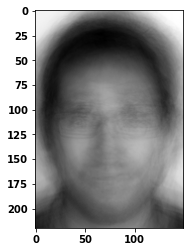

In [65]:
def showAverageFace(matrix, avg):
    avg = avg.reshape(matrix[1])
    plt.imshow(avg, cmap='gray')

showAverageFace(np_img_array, avg)

Nachdem wir uns die Bilder einzeln beatrachtet haben und mit dem im oberen Bild ausgegebenen Durchschnittsbild verglichen haben ergibt dies insgesamt ein nachvollziehbares Ergebnis. Da in den Daten hauptsächlich männliche Personen (_16 aus 20 Bilddateien, d.h. um die 80%_) enthalten sind, sieht man auch eine deutliche Entwicklung zu einem eher männlichen Zug des Durchschnittgesichts.Dies entspricht sowohl einem eher kantigen Gesichtszug, als auch dem leicht sichtbaren Ansatz eines Bartes. Frauen sind in den Bilddateien dagegen deutlich unterrepräsentiert mit nur 20%, bzw. 4 Bildern in den Bilddatensätzen. Ebenso fehlen andere ethnische Gruppen, da die hier vorliegende Gruppe hauptsächlich aus kaukasisch weißen Personen besteht. Darüber hinaus ist auffällig, dass bei näherer Betrachtung ebenso die Umrisse eines Brillengestells zu erkennen ist, obwohl nur 5 von 20 Personen (_d.h. ein Viertel der Probanden, oder 25%_) in den Trainingsdaten eine Brille tragen. Diese Markanz kann daran liegen, dass in diesem Gesichtsbereich sonst eher helle Pixelpunkte und keine dominaten Gesichtszüge liegen. 

Interessant ist darüber hinaus, dass in Studien die Durchschnittsgesichter von Personen häufig auch als attraktiver befunden wurden, da ihre Gescihtsproportionen als eher weicher wahrgenommen werden. Dies entspricht der Durchschnittshypothese von Langlois und Roggman (1990).

## Berechnung der Eigenfaces

__Aufgaben:__

1. Implementieren Sie die Funktion _calculateEigenfaces(adjfaces,width,height)_. Dieser Funktion werden die normierten Bilder _NormedArrayOfFaces_ zusammen mit der Bildbreite und -höhe übergeben. Zurück liefert die Funktion ein Numpy-Array, dessen Zeilen die berechneten normierten Eigenfaces sind. Die Berechnung der Eigenfaces ist im Theorieteil Abschnitt [Bestimmung der Eigenfaces](#theoryEig) beschrieben. Für die Python-Implementierung können Sie folgende Hinweise berücksichtigen:
    * Berechnung der transponierten eines Numpy-Arrays $A$ mit der Numpy-Methode _transpose()_
    * Matrixmultiplikation zweier Numpy-Arrays $A$ und $B$ mit der Numpy-Funktion _dot()_
    * Berechnung der Eigenvektoren und Eigenvalues eines Numpy Arrays $A$ mit der Numpy-Funktion _linalg.eigh()_
    * Sortierung von Numpy-Arrays mit den Numpy-Funktionen _sort()_ und _argsort()_.


In [66]:
def calculateEigenfaces(adjfaces, width, height):
    cv = np.dot(adjfaces, np.transpose(adjfaces)) #Kovarianzmatrix
    X = np.transpose(adjfaces)
    ew, ev = np.linalg.eigh(cv) #Eigenwert, Eigenvektor
    u1 = []
    u2 = []
    for i in range(len(ev)):
        sum = 0
        for k in range(len(ev)):
            phi = adjfaces[k]
            sum =  sum + ev[i][k] * phi
        u2.append(sum)  
        sum = sum.reshape(height, width) #Rücktransformation zu einer Matrix    
        u1.append(sum)
    u1 = np.array(u1)
    u1 = u1[np.argsort(ew)[::-1]]
    u2 = np.array(u2)
    u2 = u2[np.argsort(ew)[::-1]]
    return u1, u2

2. Aus dem von der Funktion _calculateEigenfaces(adjfaces,width,height)_ zurück gelieferten Array von Eigenfaces sind die $K$ relevantesten auszuwählen. Dieses reduzierte Array wird im Folgenden mit _Usub_ bezeichnet. Im Versuch kann $K=6$ eingestellt werden.


In [67]:
def reduceToKEigenfaces(eigenface, k):
    return eigenface[0][:k]

Usub = reduceToKEigenfaces(calculateEigenfaces(normedArrayOfFaces, 150, 220), 6)

3. Zeigen Sie die $K=6$ wichtigsten Eigenfaces als Bilder mit der [matplotlib.pyplot_-Funktion _imshow()](http://matplotlib.org/1.3.0/users/image_tutorial.html) an.

Eigenface: 1


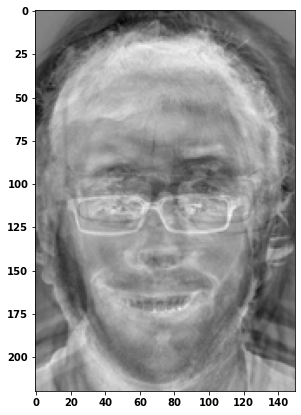

Eigenface: 2


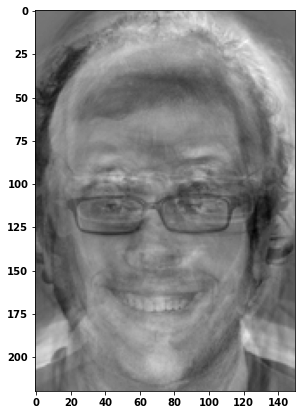

Eigenface: 3


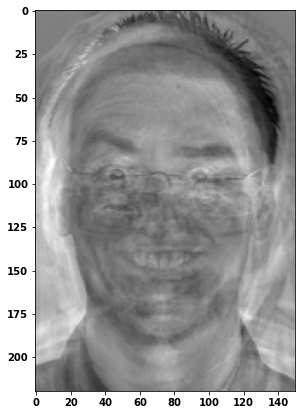

Eigenface: 4


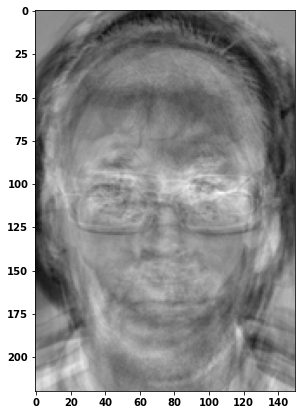

Eigenface: 5


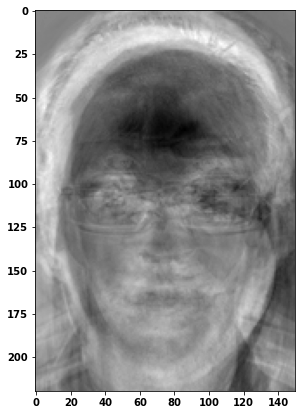

Eigenface: 6


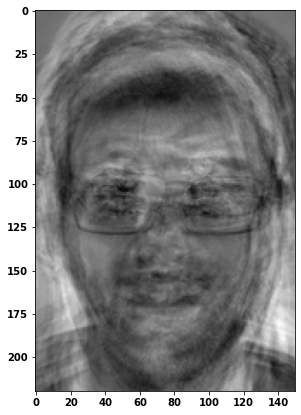

In [68]:
def showEigenFaces(matrix):
    for i in range (len(matrix)):
        print("Eigenface:", i+1)
        plt.figure(figsize=(7,7))
        plt.imshow(matrix[i], cmap="gray")
        plt.show()

showEigenFaces(Usub)

Die Kodierung und Dekodierung von Gesichtsbildern kann Einblicke in den Informationsgehalt von Gesichtsbildern geben und die bedeutenden lokalen und globalen Merkmale hervorheben. Solche Merkmale können beim Menschen selbst entweder direkt oder intuitiv zu einer Wiedererkennung von Personen auf Basis von Gesichtsmerkmalen wie Augen, Nase, Lippen und bestimmten Haaren führen.

Jedes einzelne Gesicht kann in Form einer Linearkombination der Eigenfaces dargestellt werden. Interessanterweise kann anders herum auch jedes einzelne Gesicht der Datenmenge durch diese sechs wichtigsten Eigenfaces approximiert werden. Die wichtigsten sechs Eigenfaces wurden ausgewählt, da sie die größten Eigenwerte und damit die größte Varianz innerhalb der Menge an verwendeten Gesichtsbilder aufweisen. Diese sechs Eigenfaces erstrecken sich dabei über einen sechs-dimensionalen Unterraum aller möglichen Bilder. 

Die hier dargestellten sechs wichtigsten Eigenfaces zeigen die durch den Algorithmus als markanteste globalen, und lokale Gesichtseigenschaften der jeweiligen Person berechneten Eigenvektoren als Bild dar. Diese sechs wichtigsten Eigenface Bilder machen für den weiteren Versuch den $Face Space$ aus. Interessant ist hierbei dass sowohl lokale Elemente, wie das Brillengestell, Augenform und Position, als auch ein lächelndes Gesicht besonders stark wahrgenommen werden kann. Weitere Elemente mit einem starken  Informationsgehalt sind die Kopfform, Verhältnis von Nase, Mund und Augen, sowie Haaransatz und deren Form. 

## Transformation der normierten Trainingsbilder in den Eigenface Raum

__Aufgabe:__

Die im vorigen Schritt angelegten $K$ relevantesten Eigenfaces spannen den sogenannten _Eigenface-Raum_ auf. Für jedes der normierten Trainingsbilder, also für jede Zeile aus _NormedArrayOfFaces_, sind die Koordinaten im Eigenface-Raum entsprechend der Gleichung für [$\omega_{k,i}$](#theoryRec) definierten Transformation zu berechnen.

In [69]:
def createEigenRaum(Usub, normedArrayOfFaces):
    w_i = np.zeros((len(normedArrayOfFaces),len(Usub)))
    for i in  range (len(normedArrayOfFaces)):
        for k in range (len(Usub)):
           w_i[i][k] = np.dot(Usub[k].reshape(-1),normedArrayOfFaces[i])
    return w_i
w_i = createEigenRaum(Usub, normedArrayOfFaces)
print(w_i.shape)

(63, 6)


## Gesichtserkennung

__Aufgaben:__

1. Wählen Sie ein Bild aus dem Verzeichnis _test_ aus. Das ausgewählte zu erkennende Bild ist als Numpy-Array darzustellen. Eine Normierung der Pixelwerte in den Bereich zwischen 0 und 1 ist durchzuführen (wie bereits oben beschrieben). Schließlich muss auch von diesem Bild das Durchschnittsbild aller Trainingsbilder abgezogen werden. Diese Prozessschritte entsprechen der oben beschriebenen Vorverarbeitung der Trainingsbilder. Das resultierende normierte und mittelwertfreie Bild wird im Folgenden mit _NormedTestFace_ bezeichnet.

In [70]:
testImages = readImageToNumpyData(testData)
testFace = testImages[0][0], testImages[1]

2. Danach sind die Koordinaten des _NormedTestFace_ im Eigenface-Raum nach Gleichung [$\omega_{k}$](#theoryRec) zu berechnen und das in diesem Raum nächstliegende Trainingsbild zu bestimmen.

In [71]:
import scipy.spatial.distance as dist

def findSimilarFaces(Usub,testFace, trainData, t):
    w_i = createEigenRaum(Usub, normedArrayOfFaces)
    avg = np.average(readImageToNumpyData(trainData)[0], axis = 0)
    normedTestFace = testFace[0] - avg
    normedTestFace = np.transpose(normedTestFace)
    w = np.zeros(len(Usub))
    for i in range (len(Usub)):
        w[i] = np.dot(Usub[i].reshape(-1), normedTestFace)
    distances = np.zeros(len(w_i))
    for i in range (len(w_i)):
        distances[i] = dist.euclidean(w, w_i[i])
    minIndex = np.argmin(distances)
    minDistance = distances[minIndex]
    similarFace = normedArrayOfFaces[minIndex].reshape(testFace[1])
    testBild = testFace[0].reshape(testFace[1])
    if minDistance > t:
        print("")
        print("Unbekanntes Gesicht gefunden")
    return similarFace, testBild, minDistance, minIndex
    

similarFaces = findSimilarFaces(Usub, testFace, trainData, 800)

__Aufgaben:__
1. Führen Sie die implementierte Gesichtserkennung für alle Bilder im Verzeichnis _test_ aus. Zeigen Sie jeweils das Testbild, das zugehörige erkannte Bild und die Distanz zwischen beiden Bildern an.


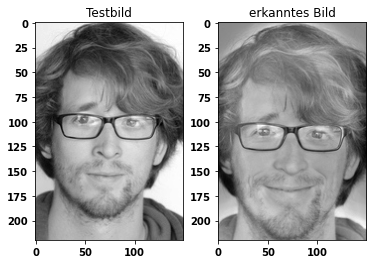

Distanz:  370.3517225296966


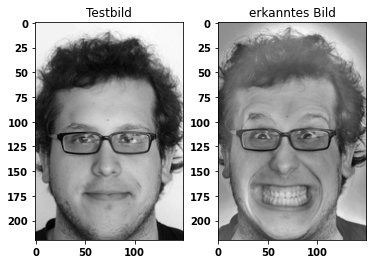

Distanz:  458.74212600728833


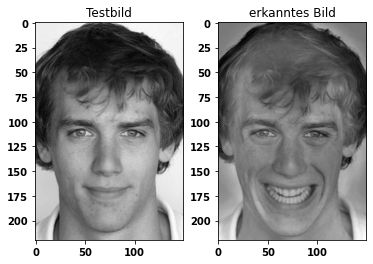

Distanz:  180.4132087658511


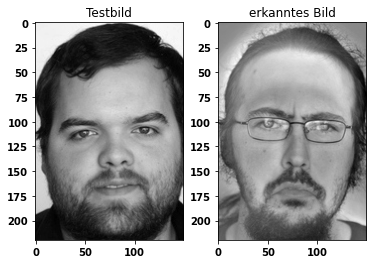

Distanz:  373.83925716941883


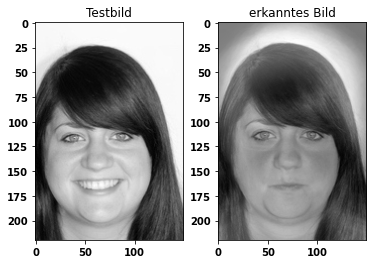

Distanz:  295.58276824145065


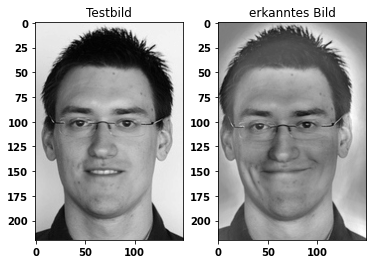

Distanz:  424.411453583935


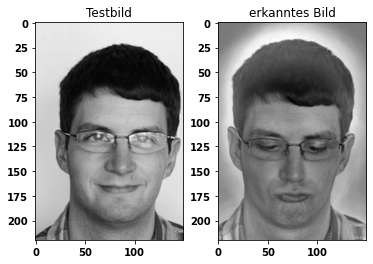

Distanz:  422.3146456168709


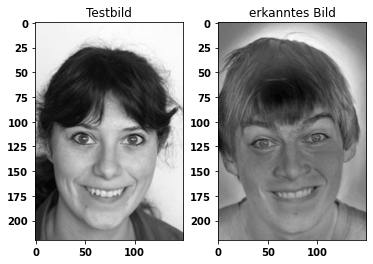

Distanz:  422.23162705449755


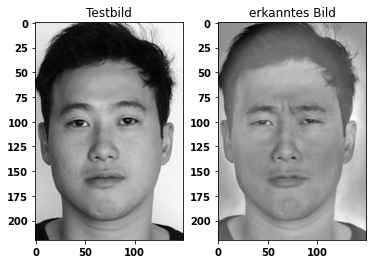

Distanz:  137.85381519793788


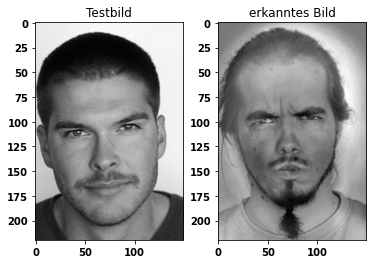

Distanz:  410.9232638822762


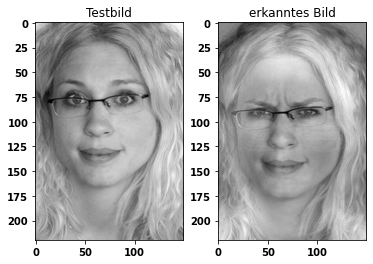

Distanz:  135.03955729902663


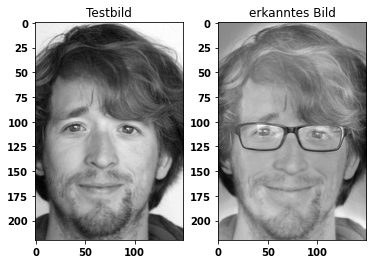

Distanz:  331.15150195955965


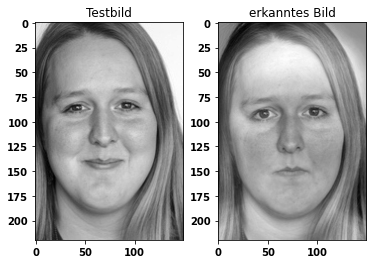

Distanz:  268.9178156120131


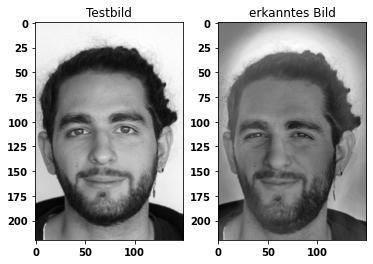

Distanz:  380.86399833192803


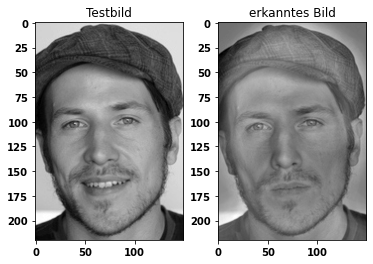

Distanz:  55.569155568047776


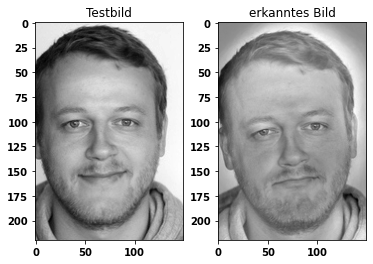

Distanz:  417.8725713491957


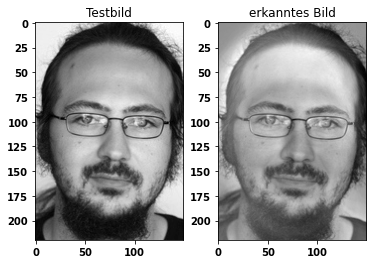

Distanz:  197.3472163566255


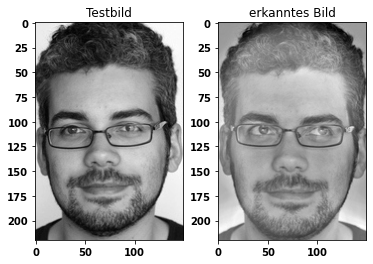

Distanz:  228.67503420866188


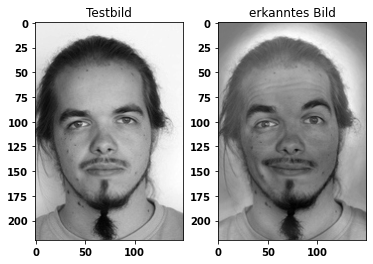

Distanz:  284.8336592767295


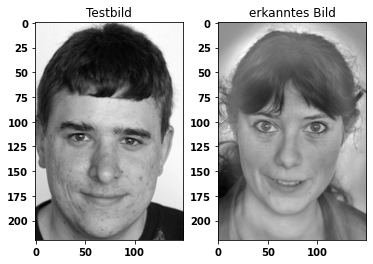

Distanz:  436.202678987293


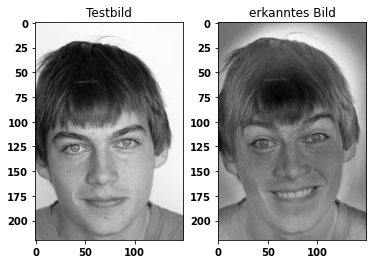

Distanz:  310.0132940782338
Es wurden  17 / 21  Bilder richtig erkannt


17

In [72]:
testImages = readImageToNumpyData(testData)

# returns True when testImage and recommended Image belong to the same person
def samePerson(testIndex, trainIndex):
    return testData[testIndex][21:23].strip("b-") == trainData[trainIndex][25:27].strip("b-")

def gesichtsErkennung(testImages):
    count = 0
    for i in  range(len(testImages[0])):
        similarFace, testBild, minDistance, trainBildIndex = findSimilarFaces(Usub, (testImages[0][i],testImages[1]), trainData, 800)
        fig, (ax1, ax2) = plt.subplots(1,2)
        ax1.set_title("Testbild")
        ax1.imshow(testBild, cmap="gray")
        ax2.set_title("erkanntes Bild")
        ax2.imshow(similarFace, cmap="gray")
        plt.show()
        if (samePerson(i, trainBildIndex)):
            count += 1
        print("Distanz: ", minDistance)
    print("Es wurden ", count,"/",len(testImages[0]), " Bilder richtig erkannt")
    return count # Anzahl richtig erkannter Bilder
gesichtsErkennung(testImages)

In den meisten Fällen (_17 von 21 Bilder, bzw. 81%_) wird das Gesicht richtig erkannt. Dies ist eine sehr gute Rate für die Zuverlässigkeit des trainierten Modells. Bei den falsch zugeordneten Bildern lässt sich trotzdem eine visuelle Ähnlichkeit erkennen, welche Rückschlüsse für die Fehlklassifikation liefert. Diese ähnlichen Merkmale sind oft starke, visuelle Elemente wie ein spezieller Haarschnitt, z.B. Ponny, dominante Nasenformen, Grimmassen mit breitem Lächeln oder auch prägnante Augenbrauenformen, welche offensichtlich zu einer Irritation und Fehlklassifikation führen.

2. Bestimmen Sie für die Werte $K=5,K=10$ und $K=15$ ($K$ ist die Anzahl der verwendeten Eigenfaces) die Rate falsch erkannter Bilder. 


K =  5


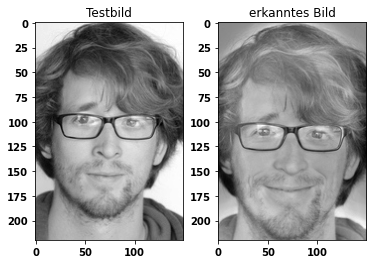

Distanz:  364.69447008414085


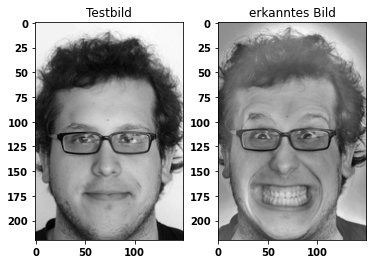

Distanz:  456.04377939061476


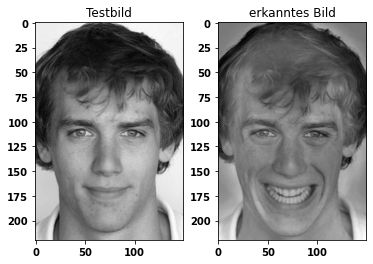

Distanz:  179.39745682934554


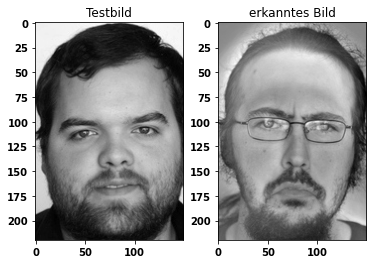

Distanz:  372.27206165949656


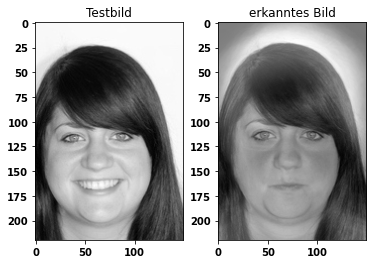

Distanz:  269.4735028464015


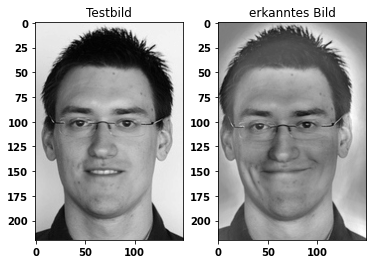

Distanz:  418.18885386670416


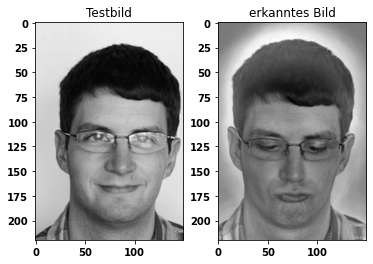

Distanz:  421.52344375314334


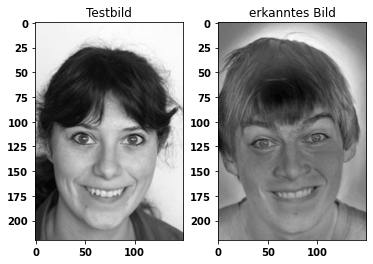

Distanz:  382.4972866000045


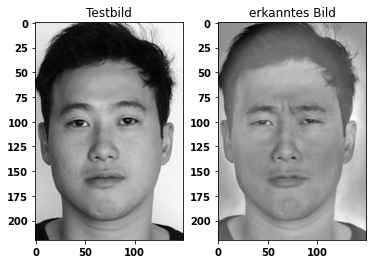

Distanz:  136.0394148782769


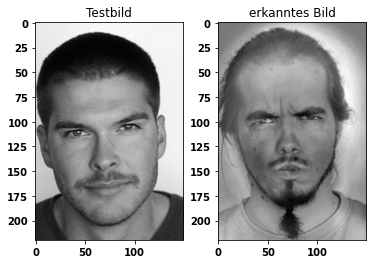

Distanz:  387.57960968516966


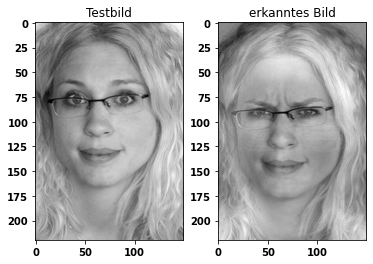

Distanz:  120.02295702963174


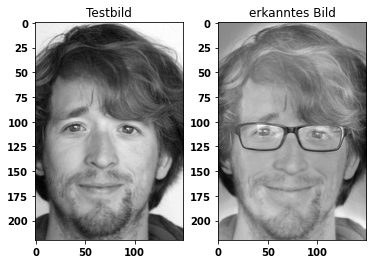

Distanz:  292.3043365667677


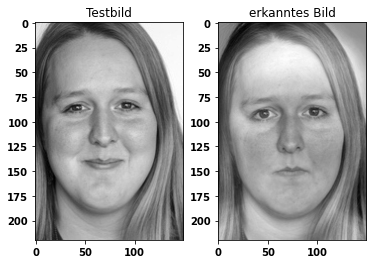

Distanz:  264.1492846833962


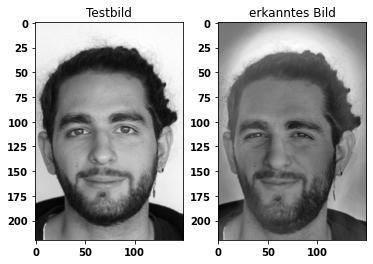

Distanz:  336.6304219970453


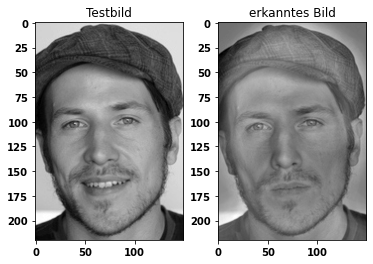

Distanz:  47.221479049882866


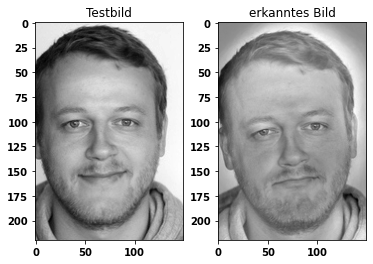

Distanz:  376.3507991106562


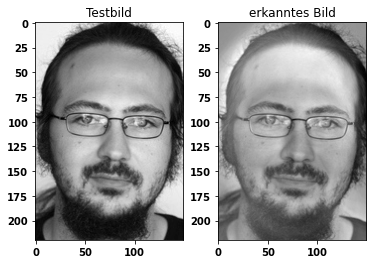

Distanz:  196.8624474530409


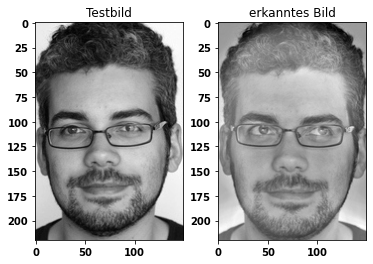

Distanz:  221.26930440083984


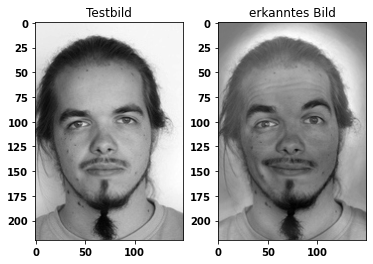

Distanz:  283.8571972520355


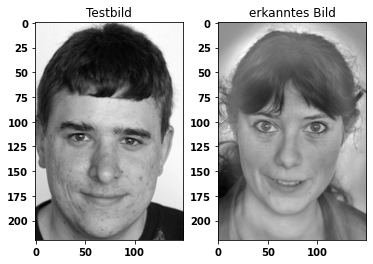

Distanz:  403.96651616275096


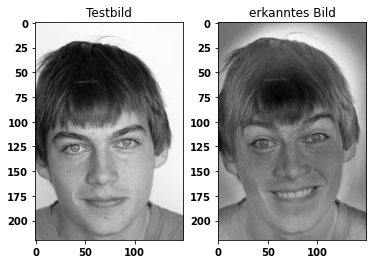

Distanz:  301.48364881919434
Es wurden  17 / 21  Bilder richtig erkannt
Falsch erkannte Bilder:  4


In [73]:
k = 5
Usub = reduceToKEigenfaces(calculateEigenfaces(normedArrayOfFaces, 150, 220), k)
print("")
print("K = ", k)
print("Falsch erkannte Bilder: ", (21-gesichtsErkennung(testImages)))


K =  10


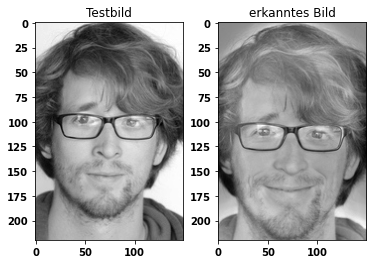

Distanz:  483.2483542854426


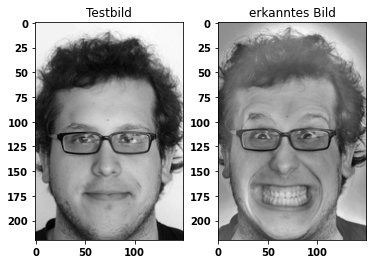

Distanz:  651.8281349736474


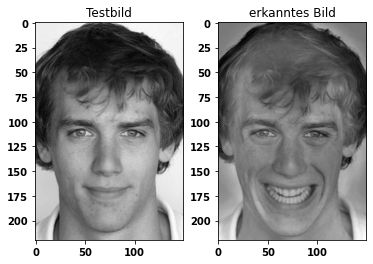

Distanz:  209.06937065437234


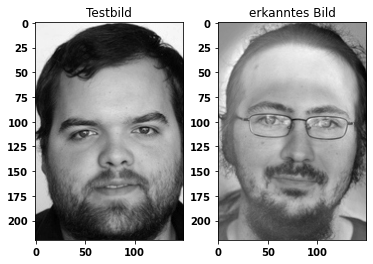

Distanz:  573.3283608278276


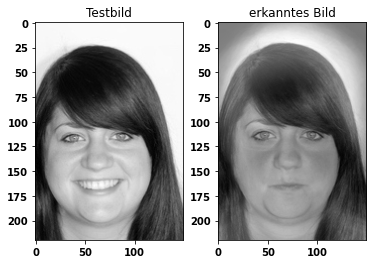

Distanz:  364.8169501947852


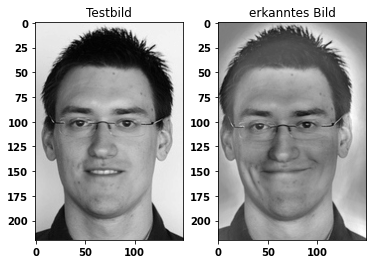

Distanz:  555.0299453242606


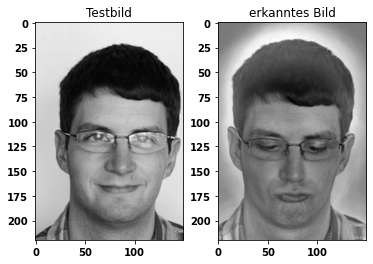

Distanz:  635.4079030172313

Unbekanntes Gesicht gefunden


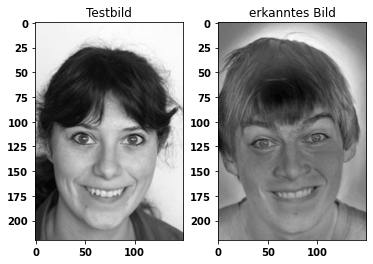

Distanz:  900.1570224826625


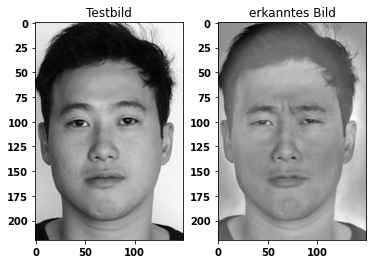

Distanz:  180.47296199976964


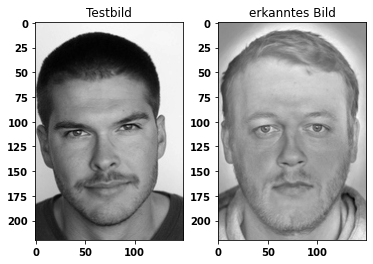

Distanz:  713.032519846576


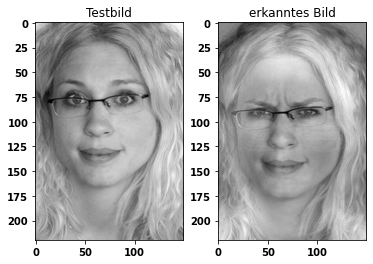

Distanz:  160.69246688877388


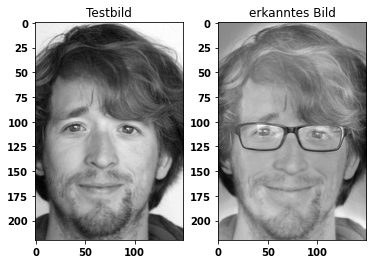

Distanz:  438.6221939043143


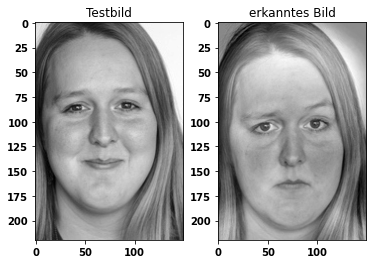

Distanz:  358.6537897168206


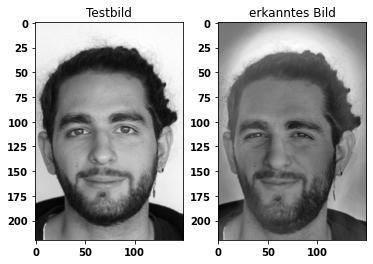

Distanz:  525.0654665758113


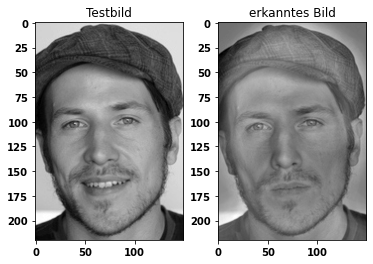

Distanz:  75.01830102430645


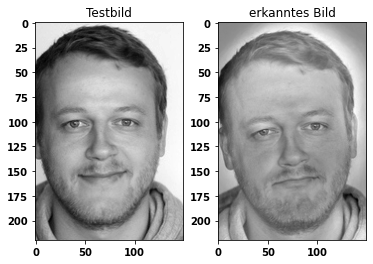

Distanz:  472.7417454284857


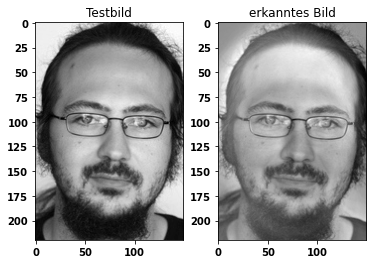

Distanz:  243.3857330513604


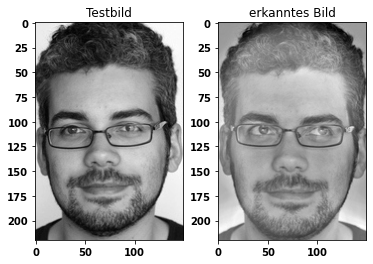

Distanz:  462.5268593627048


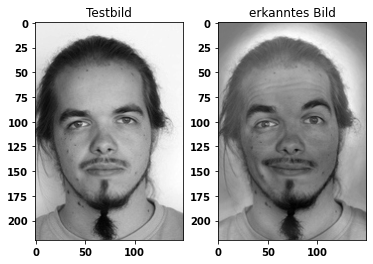

Distanz:  380.2024238616577


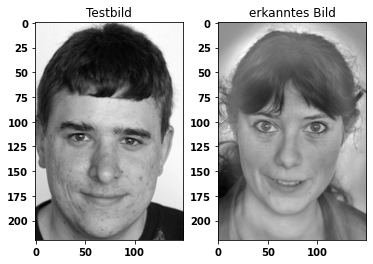

Distanz:  624.1819712020776


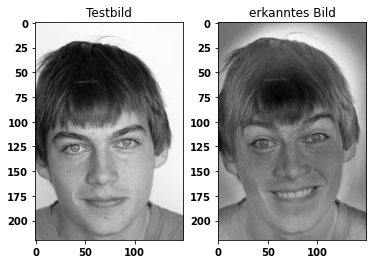

Distanz:  416.074752404007
Es wurden  17 / 21  Bilder richtig erkannt
Falsch erkannte Bilder:  4


In [74]:
k = 10
Usub = reduceToKEigenfaces(calculateEigenfaces(normedArrayOfFaces, 150, 220), k)
print("")
print("K = ", k)
print("Falsch erkannte Bilder: ", (21-gesichtsErkennung(testImages)))


K =  15


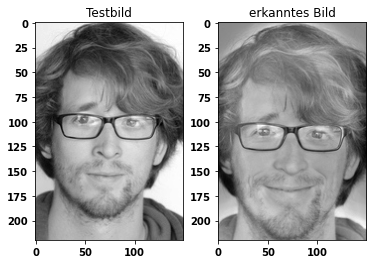

Distanz:  526.9094209719493


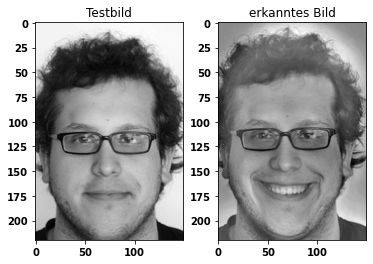

Distanz:  790.0707687994948


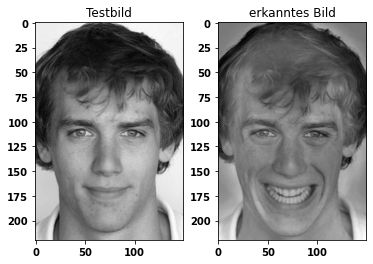

Distanz:  329.350258641648


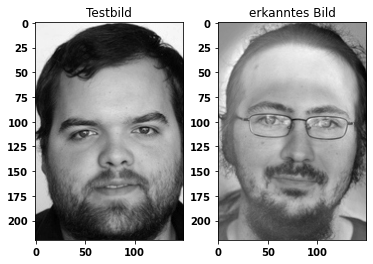

Distanz:  779.8507004062235


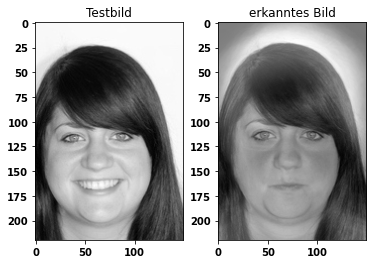

Distanz:  418.73593425454396


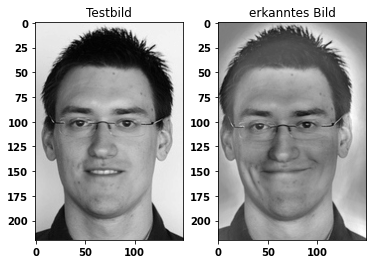

Distanz:  597.6375695327386


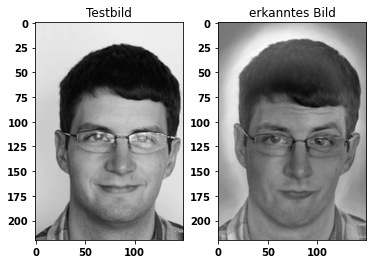

Distanz:  729.7767175783429

Unbekanntes Gesicht gefunden


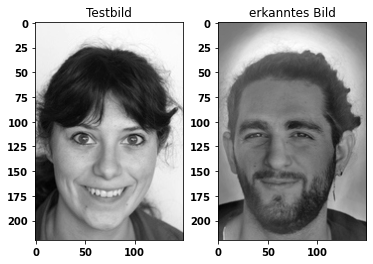

Distanz:  1085.61704631556


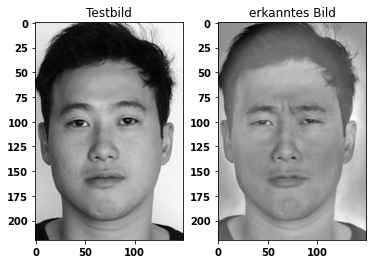

Distanz:  183.0172552543997


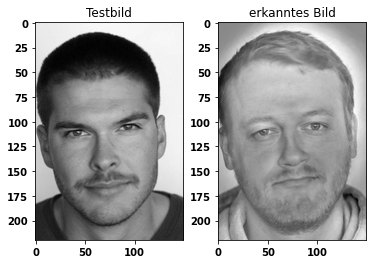

Distanz:  792.8077004637039


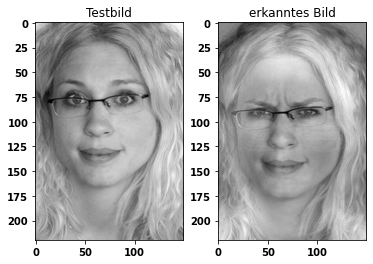

Distanz:  265.5322059652113


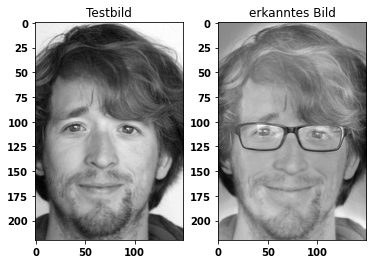

Distanz:  529.1643807441005


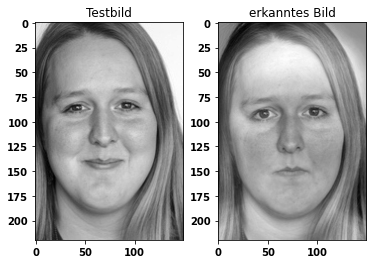

Distanz:  478.5812115527151


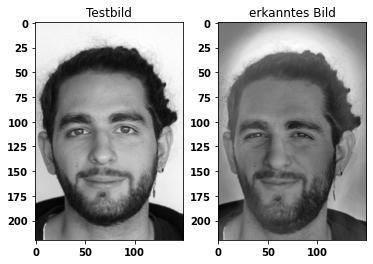

Distanz:  689.2891296391209


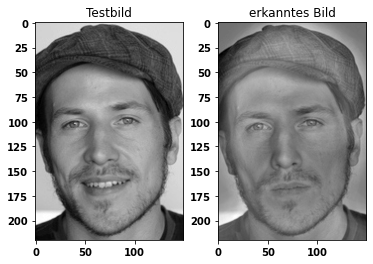

Distanz:  85.76427044114762


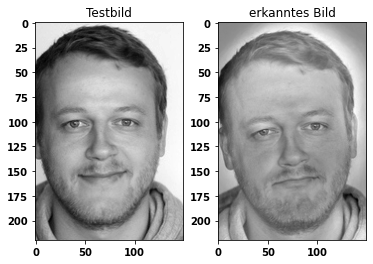

Distanz:  542.0643878459406


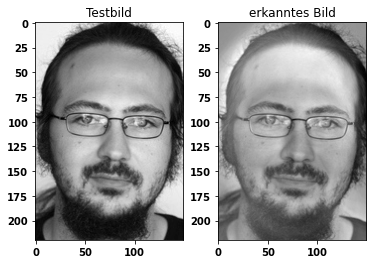

Distanz:  274.9795071644201


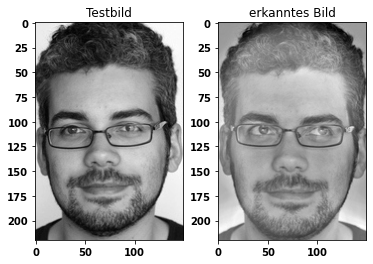

Distanz:  547.9203543255705


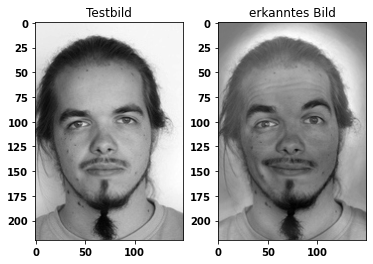

Distanz:  440.700548092691


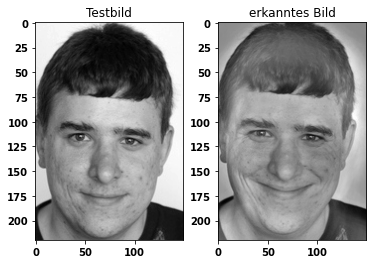

Distanz:  681.9582565808223


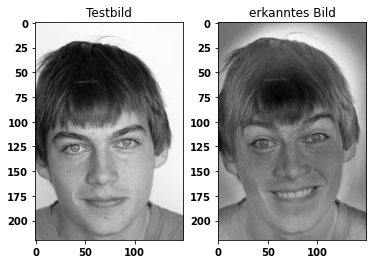

Distanz:  497.58137427260573
Es wurden  18 / 21  Bilder richtig erkannt
Falsch erkannte Bilder:  3


In [75]:
k = 15
Usub = reduceToKEigenfaces(calculateEigenfaces(normedArrayOfFaces, 150, 220), k)
print("")
print("K = ", k)
print("Falsch erkannte Bilder: ", (21-gesichtsErkennung(testImages)))


K =  1


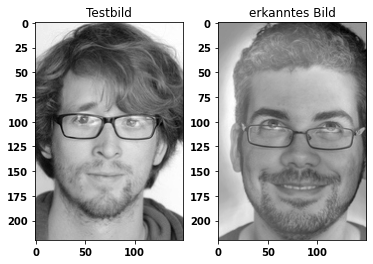

Distanz:  7.94482421875


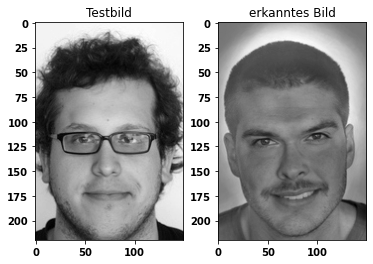

Distanz:  20.98309326171875


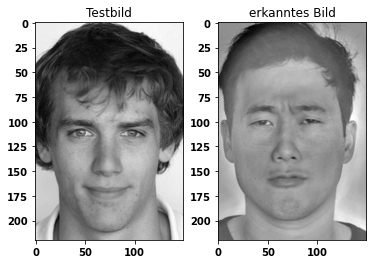

Distanz:  5.025888442993164


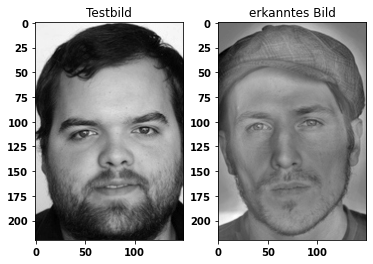

Distanz:  2.765472412109375


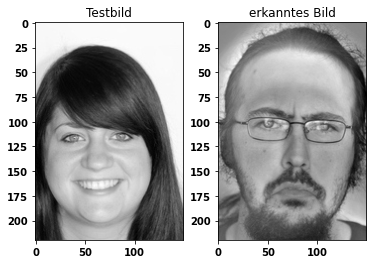

Distanz:  0.927825927734375


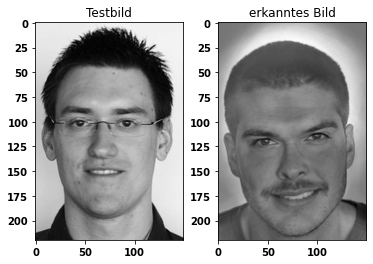

Distanz:  15.802978515625


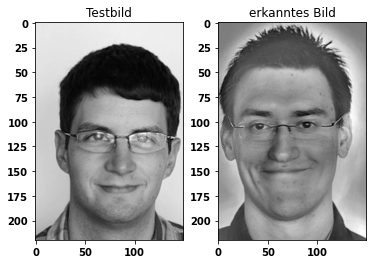

Distanz:  8.425506591796875


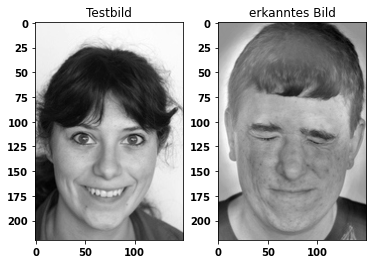

Distanz:  6.3821563720703125


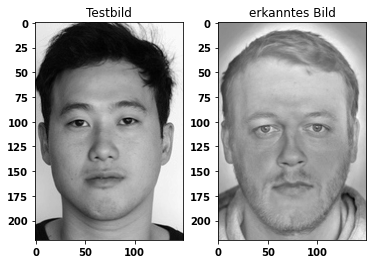

Distanz:  6.4058380126953125


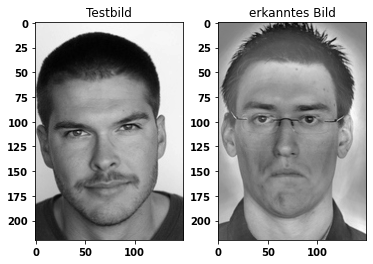

Distanz:  5.930023193359375


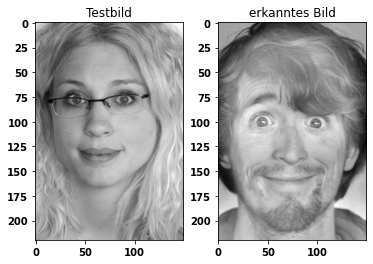

Distanz:  19.45343017578125


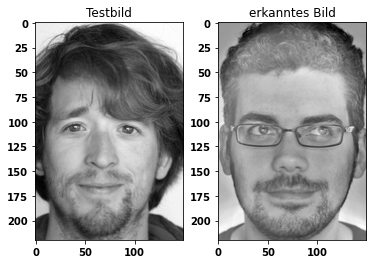

Distanz:  1.236663818359375


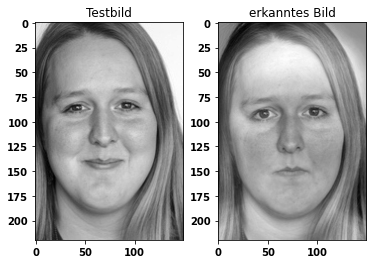

Distanz:  67.3994140625


In [ ]:
x = np.arange(1, 30).tolist()
y = []
for k in x:
    Usub = reduceToKEigenfaces(calculateEigenfaces(normedArrayOfFaces, 150, 220), k)
    print("")
    print("K = ", k)
    y.append((21-gesichtsErkennung(testImages)))

In [ ]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}

plt.rc('font', **font)
plt.figure(figsize=(10,15))
plt.bar(x, y)
plt.xlabel("K")
plt.ylabel("Anzahl falsch erkannter Bilder")
for i, v in enumerate(y):
    plt.text(i, v, " "+str(v))
plt.show

Es ist zu erkennen, dass mit steigendem K-Wert die Rate richtig erkannter deutlich Bilder zunimmt. Dies liegt daran, dass je mehr Eigenfaces, den $Face Space$ ausmachen, die Informationen zur Beschreibung aller Gesichter sich auch deutlich verbessert. Dennoch reicht auch ein kleineres Set an Eigenfaces aus, um gute Ergebnisse zu erzielen. In diesem Fall ist zu erkennen, dass ab einem 30-dimensionalen Unterraum mit 30 Eigenfaces eine deutliche Verbesserung in der Klassifzierung der Testdaten ergbit. 

Fehlklassifikationen mit einem geringeren $Face Space$ zu beginn des Trainings zeigen dass auch hier Fehlinterpretationen aufgrund markanter Elemente wie Brillengestell, Haarschnitt oder Gesichtsverhältnis zu Nase oder Augenform ergibt.

## Zusatzaufgabe - Gesichtserkennung mittels Eigenfaces
Im Folgenden wird der $Prominent-Faces$ Datensatz für eine größer angelegte Untersuchung der Gesichtserkennung (engl., Facerecognition) mittels Eigenfaces ausgewählt. Diese Daten enthalten eine Reihe von Gesichtsbildern im PGM Format, die aus verschiedenen Quellen gesammelt, zugeschnitten und in grey-scale abgelegt wurden. Der aufgebaute Datensatz kann unter dem Link [Prominent Faces](http://conradsanderson.id.au/lfwcrop/lfwcrop_grey.zip) für eine nähere Beschreibung aufgerufen und gefunden werden.

In [26]:
import matplotlib.pyplot as plt
import numpy as np
import os

Die Trainingsdaten bestehen aus Bildern von prominenten, amerikanischen Persönlichkeiten. 

In [27]:
dir='./promi_data_grey/'

In [28]:
def show_images(images, titles, h, w, n_row, n_col):
    plt.figure(figsize=(2.2 * n_col, 2.2 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.20)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i])
        plt.xticks(())
        plt.yticks(())

Aus Gründen der Komplexität werden im Folgenden nur die ersten 1000 aus den 13.000 vorhandenen der Prominenten Gesichtsbilder ausgewählt. 

In [44]:
celebrity_img = os.listdir(dir)[1:1001]
celebrity_images = [dir+'/' + photo for photo in celebrity_img]

Die gewählten Bilder werden zur Verarbeitung in numpy array (_shape: 1000, 64, 64_) umgewandelt.
Im Folgenden werden 16 zufällig ausgewählte Bilder des Datensatzes ausgegeben, um einen ersten Eindruck über die Verteilung und Inhalte dieser zu erhalten. 

In [45]:
images = np.array([plt.imread(image) for image in celebrity_images], dtype=np.float64)
celebrity_names = [name[:name.find('0')-1].replace("_", " ") for name in celebrity_images]
display(celebrity_names)

['E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor Sc. ',
 'E:/Bachelor

In [ ]:
n_samples, h, w = images.shape
show_images(images, celebrity_names, h, w, n_row=4, n_col=4)

#### Berechnung des PCA
In diesem Schritt wird der PCA berechnet und die Eigenfaces, welche eine große Varianz über die gesamten Bilddateien aufweisen selektiert. Weitere Informationen für die Verwendung von SVD kann unter dem [MIT Open Course Ware Video](https://www.youtube.com/watch?v=cOUTpqlX-Xs) gefunden werden.

In [23]:
def pca(X, n_pc):
    n_samples, n_features = X.shape
    mean = np.mean(X, axis=0)
    centered_data = X-mean
    U, S, V = np.linalg.svd(centered_data)
    components = V[:n_pc]
    projected = U[:,:n_pc]*S[:n_pc]
    
    return projected, components, mean, centered_data

Im Folgenden werden die Merkmale aus den Bildern errechnet, welche die einzelnen Individuen aus dem Trainingsdatensatz von einander unterscheiden. Das Durchschnittsgesicht wird zudem subtrahiert, um die Varianz der Eigenfaces zu maximieren. Hier sollen die $k=50$ wichtigsten Eigenfaces verwendet werden, um den k-dimensionalen Subspace für eine spätere Rekonstruktion dieser aufzuspannen. 

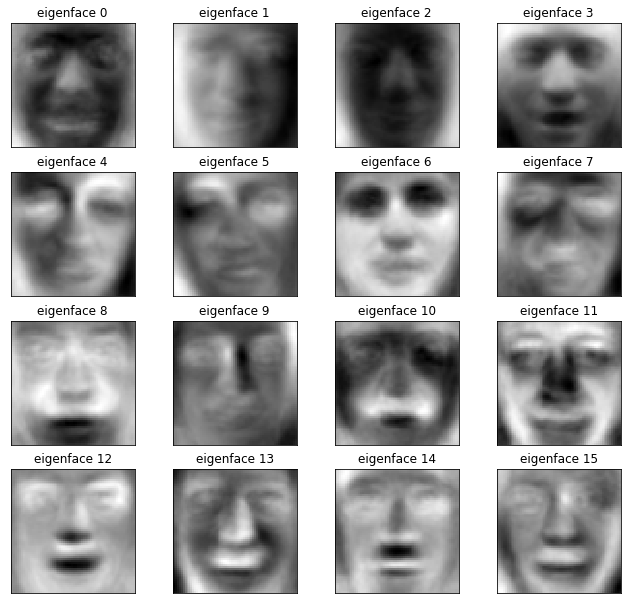

In [25]:
k = 50
X = images.reshape(n_samples, h*w)
P, C, M, Y= pca(X, n_pc=k)
eigenfaces = C.reshape((n_components, h, w))
eigenface_titles = ["eigenface %d" % i for i in range(eigenfaces.shape[0])]
show_images(eigenfaces, eigenface_titles, h, w, 4, 4) 

Der erste Parameter _k_ bestimmt, wie viele Eigenfaces wir erzeugen wollen. Diese stellen den $Face Space$ dar, aus dem die das menschliche Gesichter wiederherstellt werden sollen. Der $Face Space$ wurde hier auf die k=50 wichtgisten Eigenfaces reduziert, welche die stärkste Varianz aufweisen. Hieraus ergibt sich zudem _(eigenfaces.shape = (50, 64, 64))_.

Übersetzt mit www.DeepL.com/Translator (kostenlose Version)

In [31]:
def reconstruction(Y, C, M, h, w, image_index):
    n_samples, n_features = Y.shape
    weights = np.dot(Y, C.T)
    centered_vector=np.dot(weights[image_index, :], C)
    recovered_image=(M+centered_vector).reshape(h, w)
    return recovered_image

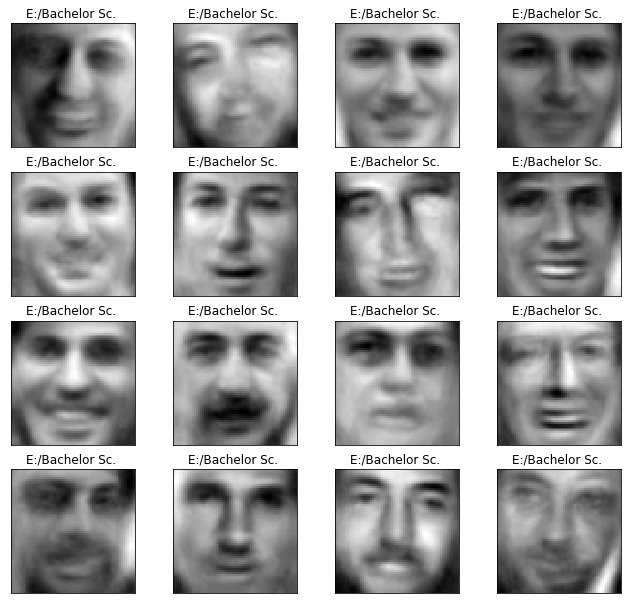

In [32]:
# reconstruction of the images
recovered_images=[reconstruction(Y, C, M, h, w, i) for i in range(len(images))]
show_images(recovered_images, celebrity_names, h, w, n_row=4, n_col=4)

Man kann bereits klare Gesichtszüge erkennen, darunter fallen Lippen, Nase als auch Augen und Augenbrauenstruktur. Das Ergebnis ist bei $k=50$ Eigenfaces dennoch nicht zufriedenstellend in dessen Qualität und wird in den folgenden Schritten probeweise erhöht. 

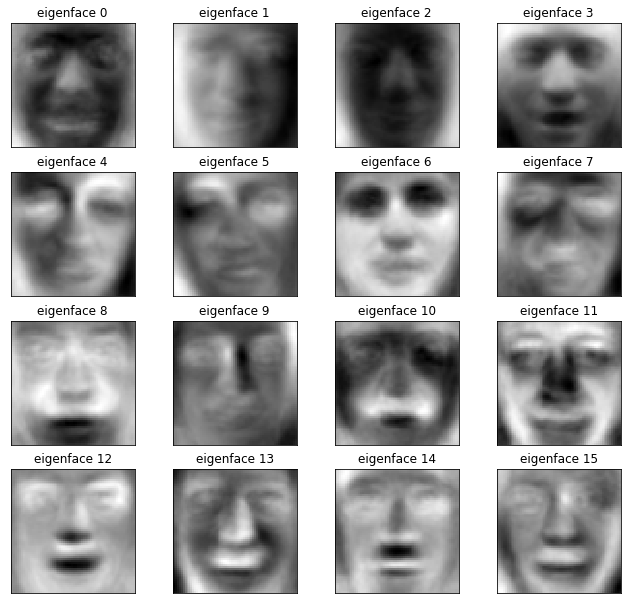

In [33]:
k = 100
X = images.reshape(n_samples, h*w)
P, C, M, Y= pca(X, n_pc=n_components)
eigenfaces = C.reshape((n_components, h, w))
eigenface_titles = ["eigenface %d" % i for i in range(eigenfaces.shape[0])]
show_images(eigenfaces, eigenface_titles, h, w, 4, 4) 

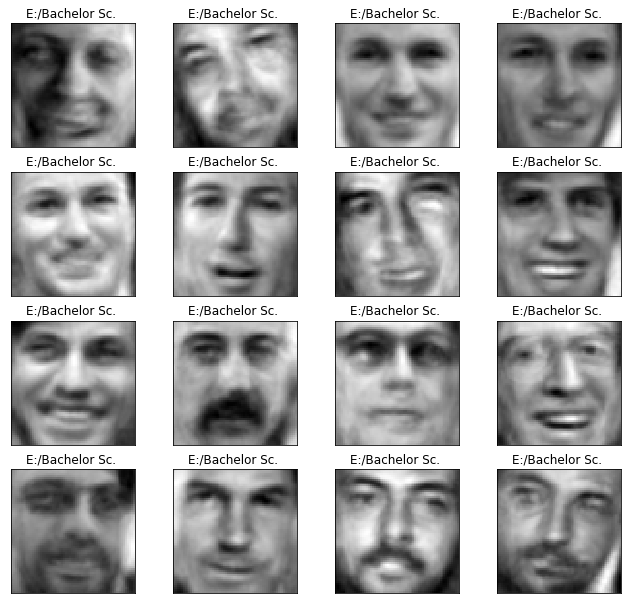

In [35]:
# reconstruction of the images
recovered_images=[reconstruction(Y, C, M, h, w, i) for i in range(len(images))]
show_images(recovered_images, celebrity_names, h, w, n_row=4, n_col=4)

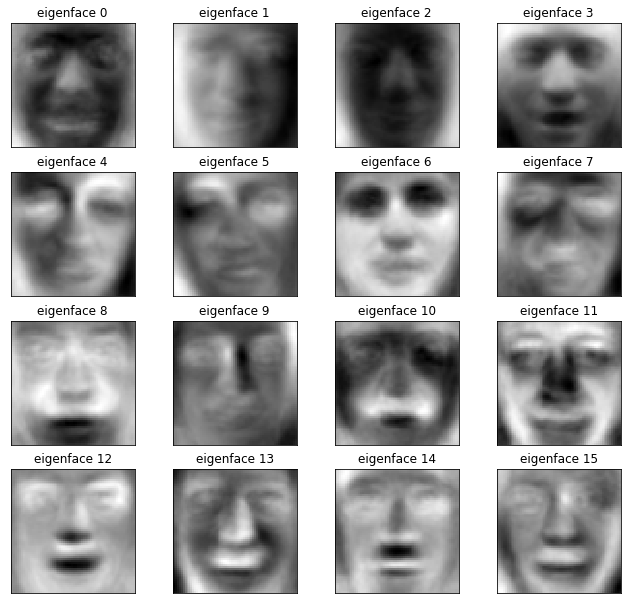

In [36]:
k = 250
X = images.reshape(n_samples, h*w)
P, C, M, Y= pca(X, n_pc=n_components)
eigenfaces = C.reshape((n_components, h, w))
eigenface_titles = ["eigenface %d" % i for i in range(eigenfaces.shape[0])]
show_images(eigenfaces, eigenface_titles, h, w, 4, 4) 

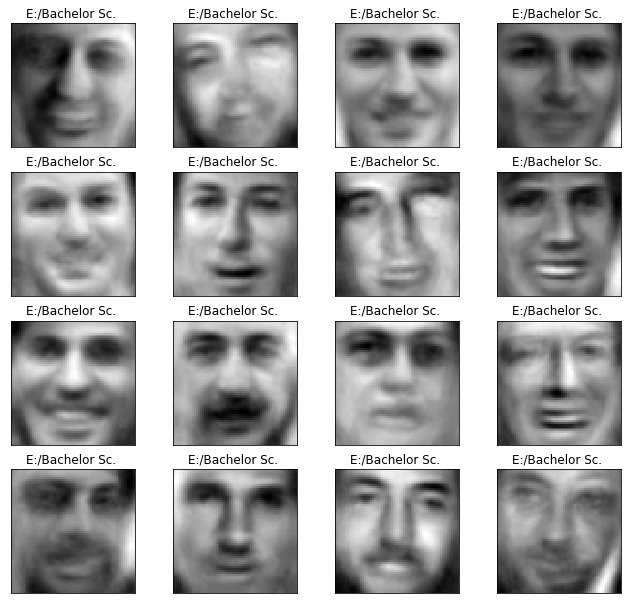

In [37]:
# reconstruction of the images
recovered_images=[reconstruction(Y, C, M, h, w, i) for i in range(len(images))]
show_images(recovered_images, celebrity_names, h, w, n_row=4, n_col=4)